In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import anndata as ad
import sys
import bbknn
from statsmodels import robust
import matplotlib.pyplot as plt
import os.path
import harmonypy as hm

import celltypist
from celltypist import models

import muon as mu
from muon import MuData

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.settings.set_figure_params(dpi=80, color_map='viridis')
#sc.logging.print_versions()

ModuleNotFoundError: No module named 'scrublet'

In [2]:
input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_final_soupX_processed_noBatchC_dandelion.1.h5ad'
adata = sc.read_h5ad(input_file)

In [3]:
sub = adata[adata.obs['donor_id']=='TL_Mangosteen'].copy()

/home/jovyan/my-conda-envs/dandelion/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


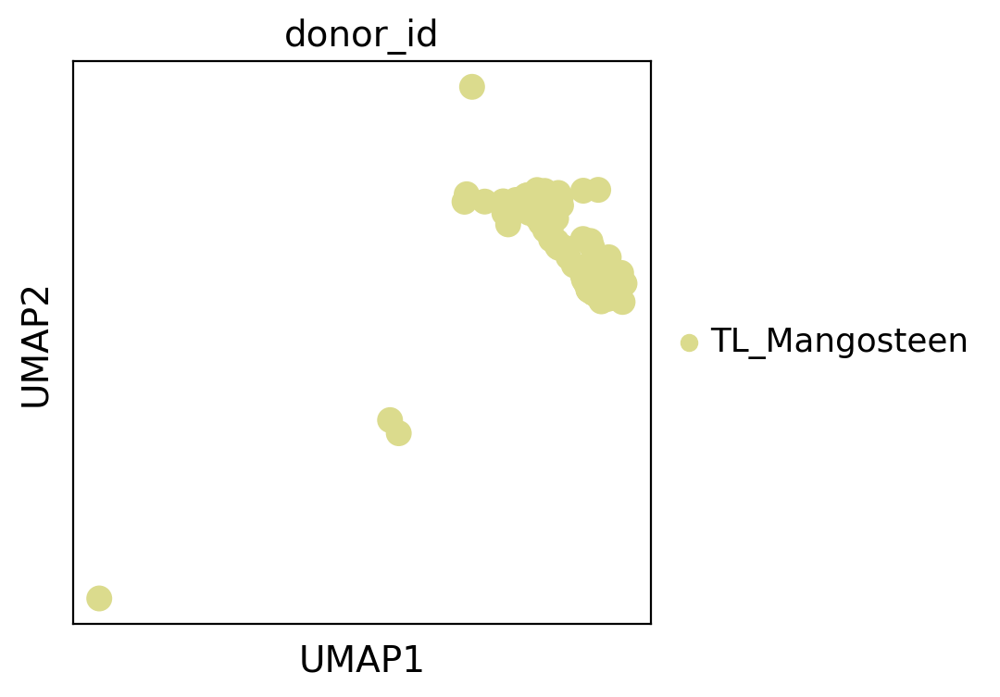

In [4]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(sub, color=['donor_id'])

/home/jovyan/my-conda-envs/dandelion/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


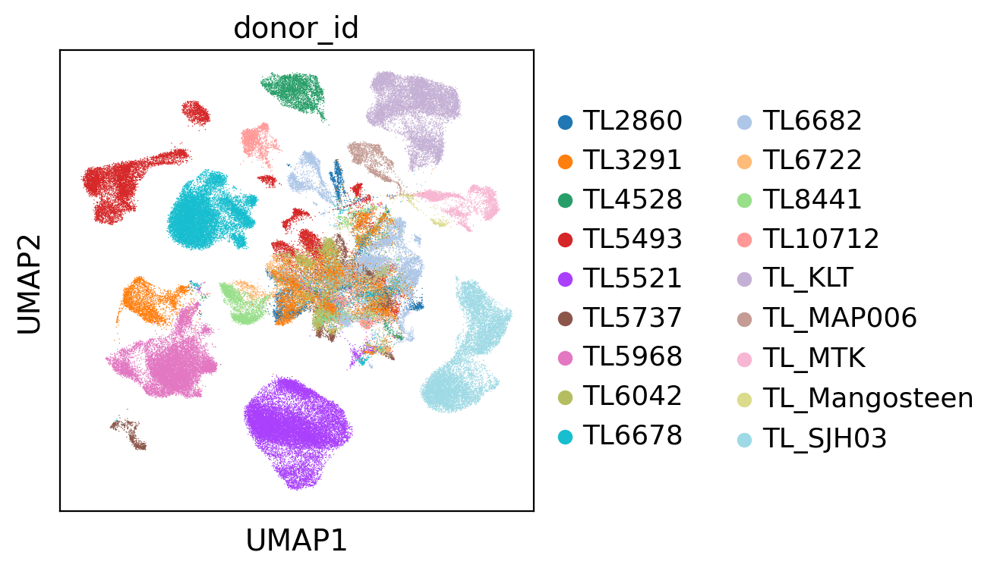

In [3]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color=['donor_id'])

In [ ]:
adata.obs['tumour_type'].replace('')

/home/jovyan/my-conda-envs/dandelion/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


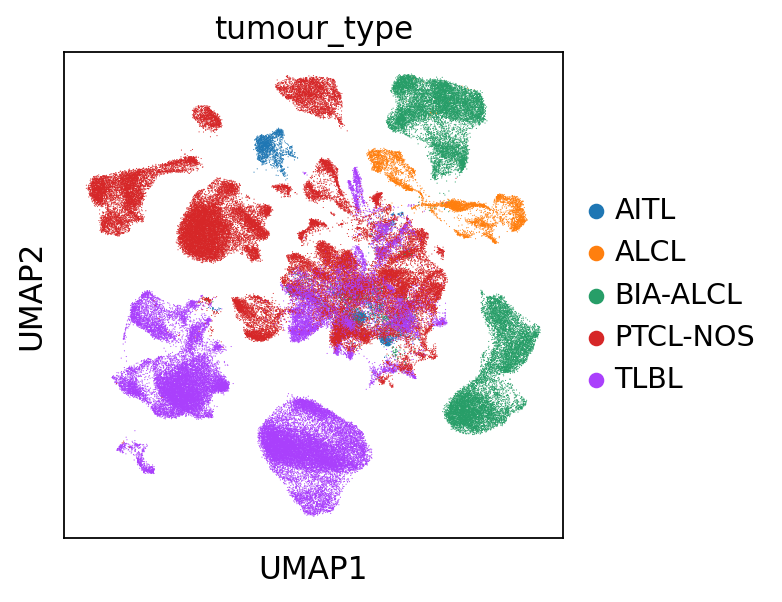

In [5]:
sc.pl.umap(adata, color=['tumour_type'])

In [ ]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(adata_filtered, color=['CD34','IGLL1','CD3E','CD4','CD8A','CD8B','TNFRSF8','FOXP3','IL2RA','ALK','CD44'],
           color_map = 'RdPu')

In [20]:
sc.tl.leiden(adata_filtered, resolution=0.8, key_added="leiden_0.8")

running Leiden clustering
    finished: found 37 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:01:03)


In [24]:
sc.tl.leiden(adata_filtered, resolution=0.1, key_added='leiden_0.8_c22', restrict_to = ('leiden_0.8', ['22']))

running Leiden clustering
    finished: found 37 clusters and added
    'leiden_0.8_c22', the cluster labels (adata.obs, categorical) (0:00:00)


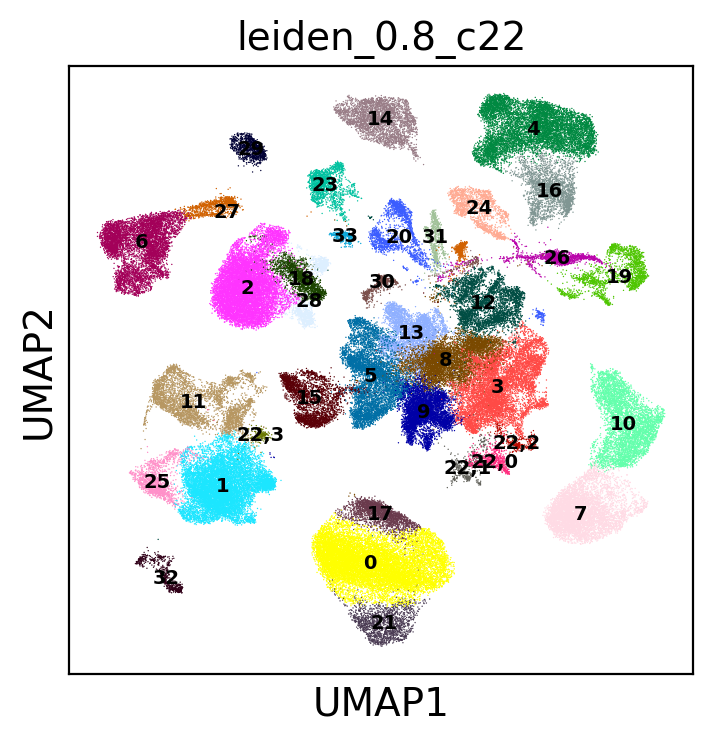

In [25]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata_filtered, color=['leiden_0.8_c22'], legend_loc='on data', legend_fontsize=7)

In [26]:
save_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_final_soupX_processed_noBatchC.h5ad'
adata_filtered.write(save_file)

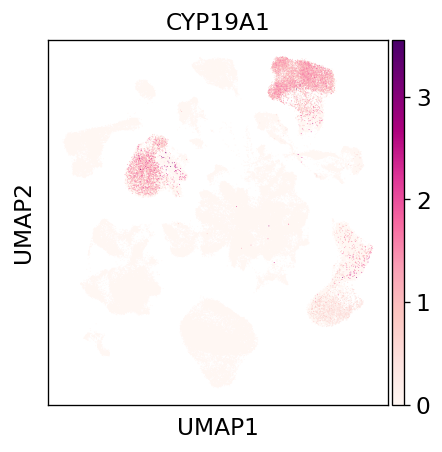

In [17]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(adata, color=['CYP19A1'],
           color_map = 'RdPu')

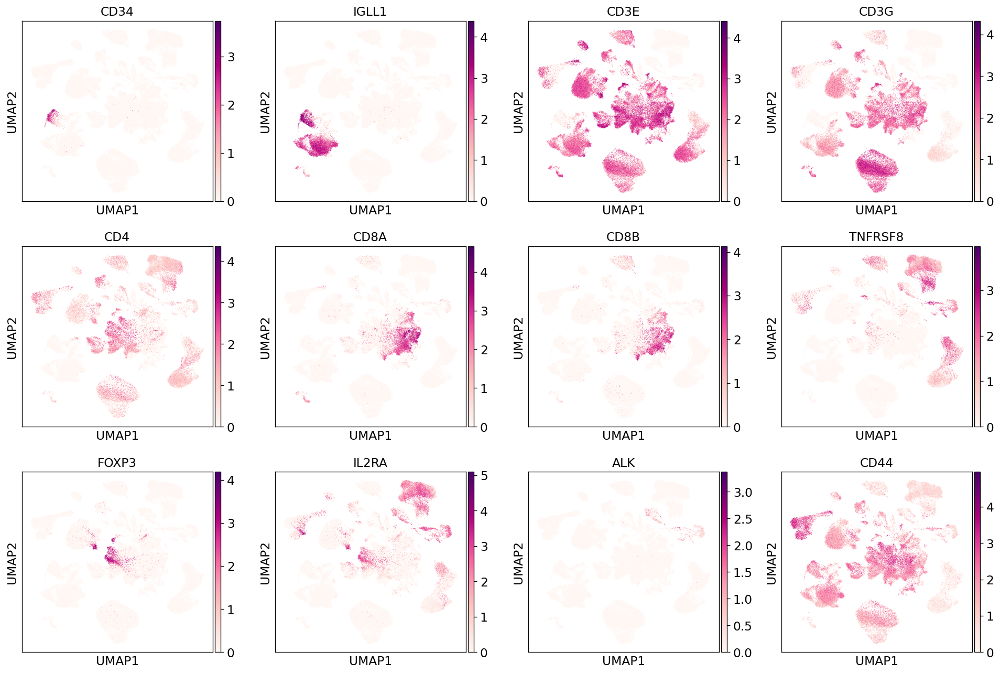

In [7]:
sc.pl.umap(adata, color=['CD34','IGLL1','CD3E','CD3G','CD4','CD8A','CD8B','TNFRSF8','FOXP3','IL2RA','ALK','CD44'],
           color_map = 'RdPu')

### CITE merge

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import sys
from statsmodels import robust
import matplotlib.pyplot as plt
import os.path
import harmonypy as hm

import celltypist
from celltypist import models

import muon as mu
from muon import MuData

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.settings.set_figure_params(dpi=80, color_map='viridis')
#sc.logging.print_versions() ### dandelion

In [2]:
input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_final_soupX_processed_noBatchC.h5ad'
#input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/Malignant_Tcell_final_initial.h5ad'
adata = sc.read_h5ad(input_file)

In [3]:
#input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/CITE_merge_all_nocleaning_normalized.h5ad' ## raw
input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/CITE_totalVI_with_all_cells.h5ad'  ## totalVI denoised
adata_cite = sc.read_h5ad(input_file)

In [4]:
mdata = MuData({"RNA": adata, "CITE": adata_cite})
mdata

MuData object with n_obs × n_vars = 135143 × 3397
  var:	'gene_ids'
  2 modalities
    RNA:	123194 x 3389
      obs:	'ID', 'sample_id', 'donor_id', 'tumour_type', 'age', 'site', 'type', 'mad_prd', 'ds', 'mad_MED', 'mad_MAD', 'mad_thr', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_0.8', 'leiden_1.0', 'leiden_1.0_c14', 'leiden_1.0_c14_C15', 'broad_cell_type', 'leiden_0.8_c22', 'leiden_0.8_c22_c3', 'malignant_call', 'malignant_call_donor', 'malignant_call_tumour_type'
      var:	'gene_ids', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'broad_cell_type_colors', 'dendrogram_leiden_0.8', 'dendrogram_leiden_1.0_c14', 'dendrogram_leiden_1.0_c14_C15', 'donor_id_colors', 'hvg', 'leiden', 'leiden_0.8_c22_c3_colors', 'leiden_0.8_c22_colors', 'leiden_0.8_colors', 'leiden_1.0_c14_C15_colors', 'leiden_1.0_c14_colors', 'leiden_1.0_colors', 'malignant_call_colors', 'malignant_call_donor_colors', 'malignant_call_tumour_type_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tumour_type_colors', 'umap'
      obsm:	'X_pca', 'X_pca_back', 'X_umap'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    CITE:	124977 x 8
      obs:	'ID', 'sample_id', 'donor_id', 'tumour_type', 'age', 'site', 'type', '_scvi_batch'
      var:	'gene_ids', 'feature_types', 'genome', 'clean_names'
      uns:	'log1p'
      layers:	'counts', 'denoised_protein', 'protein_foreground_prob'

In [5]:
mu.pp.intersect_obs(mdata)

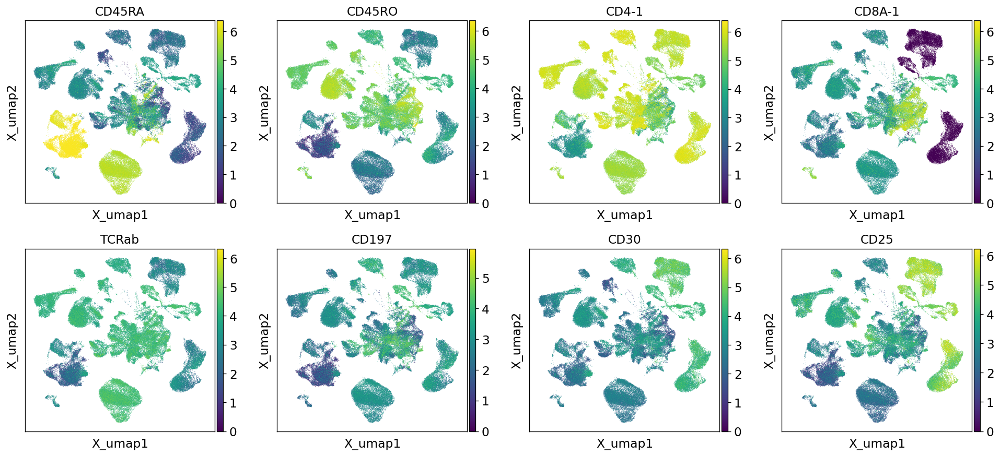

In [30]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
mu.pl.embedding(mdata, basis="RNA:X_umap", color=['CD45RA','CD45RO','CD4-1','CD8A-1','TCRab','CD197','CD30','CD25'])

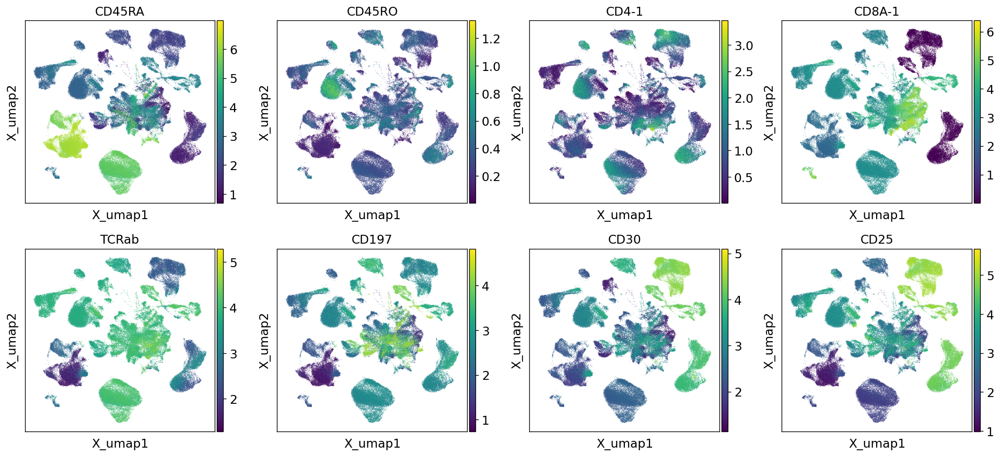

In [13]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
mu.pl.embedding(mdata, basis="RNA:X_umap", color=['CD45RA','CD45RO','CD4-1','CD8A-1','TCRab','CD197','CD30','CD25'],
                layer = 'denoised_protein') ### denoised only with T cells

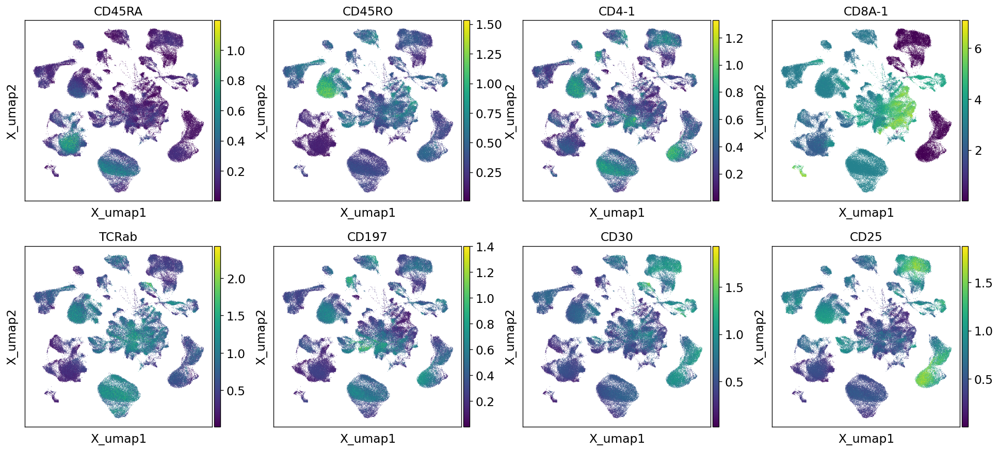

In [6]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
mu.pl.embedding(mdata, basis="RNA:X_umap", color=['CD45RA','CD45RO','CD4-1','CD8A-1','TCRab','CD197','CD30','CD25'],
                layer = 'denoised_protein') ### denoised with all cells

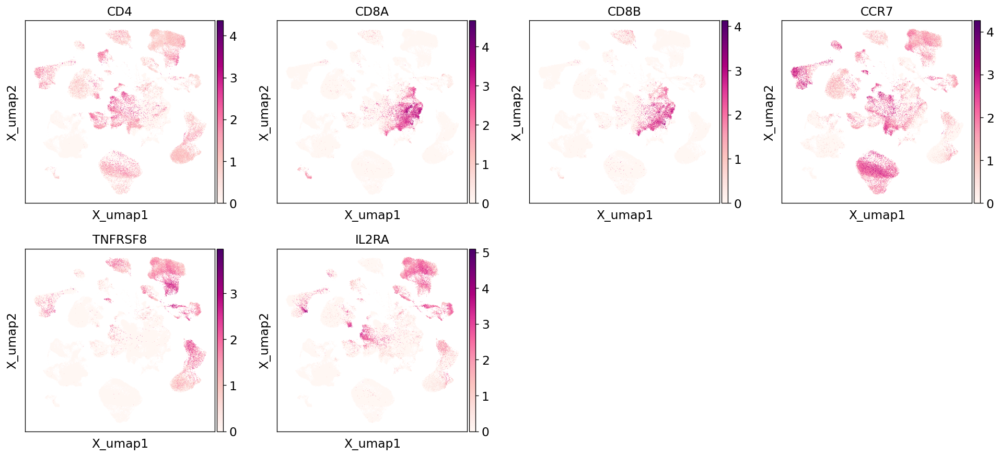

In [9]:
mu.pl.embedding(mdata, basis="RNA:X_umap", color=['CD4','CD8A','CD8B','CCR7','TNFRSF8','IL2RA'],
                color_map = 'RdPu')

In [7]:
mdata['CITE'].obs['malignant_call_donor'] = mdata['RNA'].obs['malignant_call_donor'].copy()
mdata['CITE'].obs['malignant_call'] = mdata['RNA'].obs['malignant_call'].copy()
mdata['CITE'].obs['malignant_call_tumour_type'] = mdata['RNA'].obs['malignant_call_tumour_type'].copy()

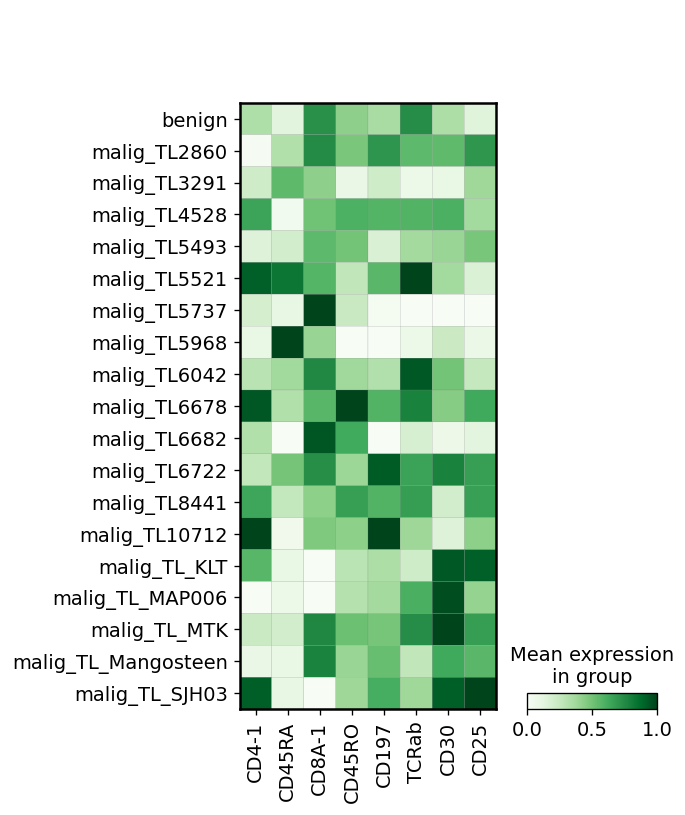

In [8]:
protein = mdata.mod['CITE']

sc.pl.matrixplot(
    protein,
    protein.var["clean_names"],
    groupby="malignant_call_donor",
    gene_symbols="clean_names",
    layer="denoised_protein",
    cmap="Greens",
    standard_scale="var",
)

In [31]:
protein = mdata.mod['CITE']

In [39]:
protein.var['gene_id2'] = protein.var.index
protein.var

,gene_ids,feature_types,genome,control,gene_id2
CD4-1,1,Antibody Capture,,False,CD4-1
CD45RA,2,Antibody Capture,,False,CD45RA
CD8A-1,3,Antibody Capture,,False,CD8A-1
CD45RO,4,Antibody Capture,,False,CD45RO
CD197,5,Antibody Capture,,False,CD197
TCRab,6,Antibody Capture,,False,TCRab
CD30,7,Antibody Capture,,False,CD30
CD25,8,Antibody Capture,,False,CD25


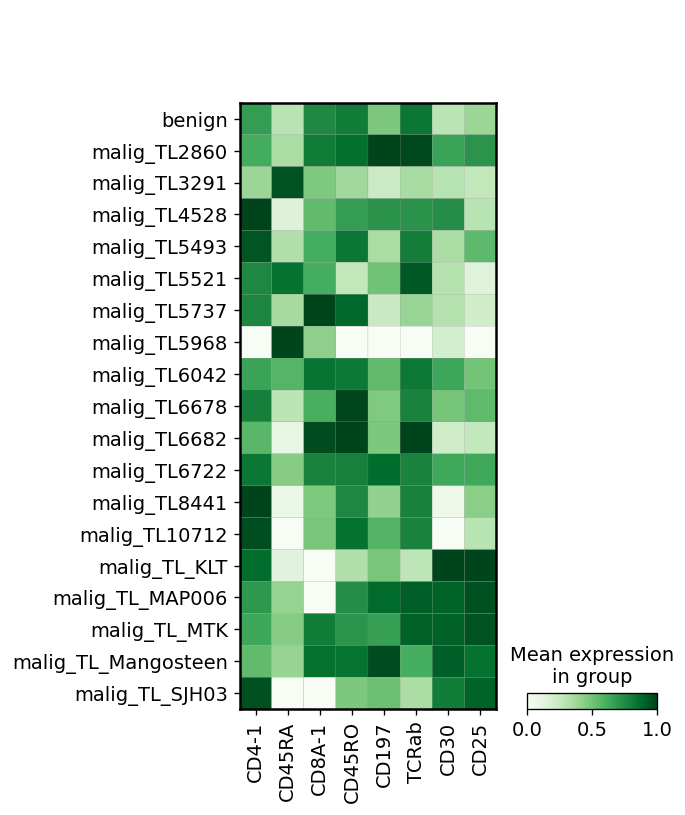

In [40]:
protein = mdata.mod['CITE']

sc.pl.matrixplot(
    protein,
    protein.var['gene_id2'],
    groupby="malignant_call_donor",
    gene_symbols='gene_id2',
    cmap="Greens",
    standard_scale="var",
)

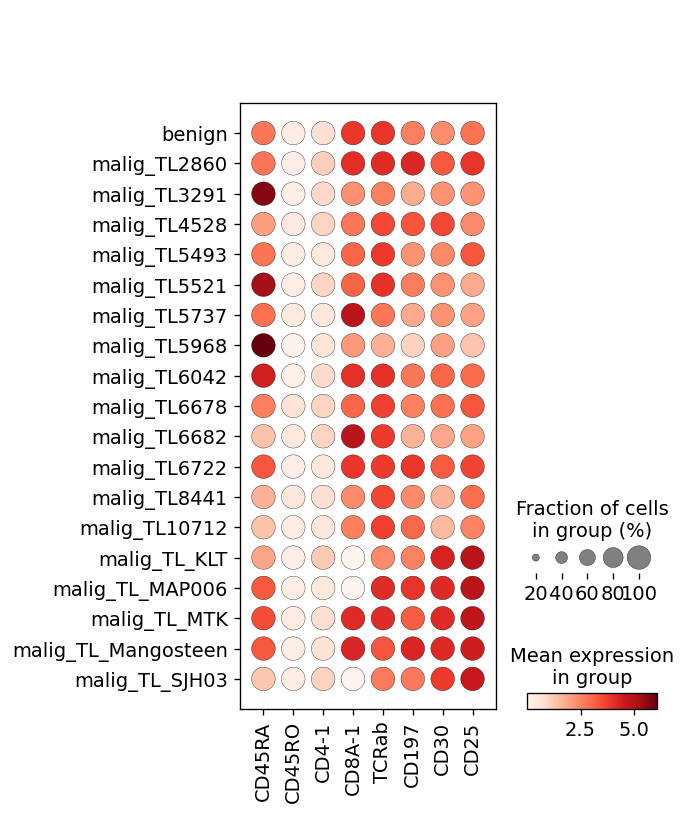

In [26]:
sc.settings.set_figure_params(dpi=60)
#sc.tl.dendrogram(adata_filtered_harmony, groupby='annot')
genes = ['CD45RA','CD45RO','CD4-1','CD8A-1','TCRab','CD197','CD30','CD25']
dp = sc.pl.dotplot(mdata['CITE'], genes, groupby='malignant_call_donor')

#### CellTypist

In [2]:
input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_final_soupX_processed_noBatchC.h5ad'
adata = sc.read_h5ad(input_file)

In [4]:
adata = adata.raw.to_adata()

In [5]:
adata.X.expm1().sum(axis = 1)

matrix([[ 9999.999],
        [ 9999.999],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.001],
        [10000.002]], dtype=float32)

In [53]:
#new_model = models.Model.load('/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_T_subset_sub0.4_Anno_level4_feature_selection.pkl')
new_model = models.Model.load(model = 'Immune_All_Low.pkl')

In [54]:
predictions = celltypist.annotate(adata, model = new_model, majority_voting = True)

🔬 Input data has 123194 cells and 30472 genes
🔗 Matching reference genes in the model
🧬 6105 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25


running Leiden clustering
    finished: found 365 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:01:08)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [55]:
adata = predictions.to_adata()

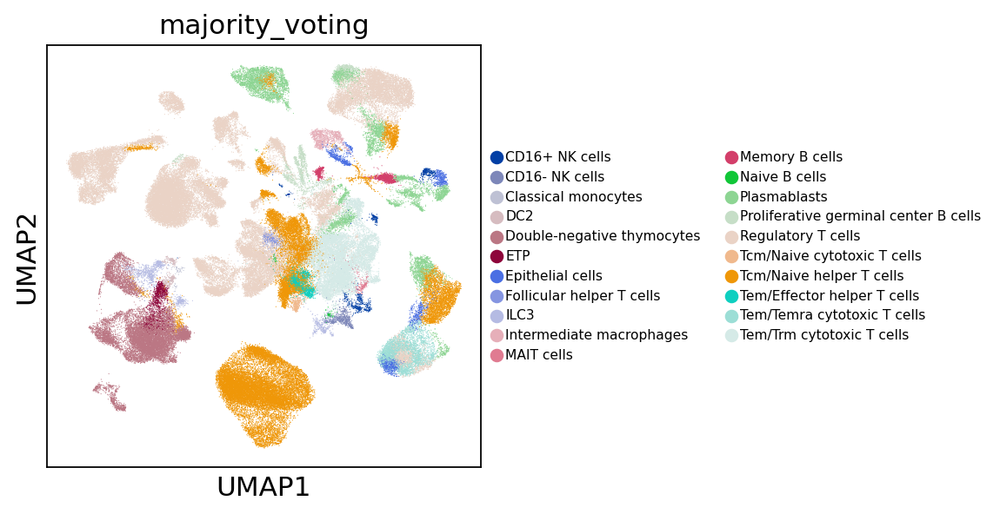

In [57]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.umap(adata, color = ['majority_voting','conf_score'], legend_fontsize=7) ### model 0.4 Anno level 4

In [9]:
input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_final_soupX_processed_noBatchC.h5ad'
adata = sc.read_h5ad(input_file)

#### Thymus atlas data

In [2]:
input_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_all.h5ad'
adata = sc.read_h5ad(input_file)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [3]:
adata.obs

,Anno_level_1,Anno_level_2,Anno_level_3,Anno_level_4,Anno_level_5,Anno_level_fig1,Sample,donor,organ,sort,method,file,Anno_stage,Age,Gender,Source
index,,,,,,,,,,,,,,,,
FCAImmP7179369-AAACCTGAGCCCAATT,T,SP,T_naive,CD8+T,CD8+T,CD8+T,F21_TH_45P,F21,TH,45P,3GEX,FCAImmP7179369,CD8+T_middle,16w,Male,HDBR
FCAImmP7179369-AAACCTGAGCCTATGT,T,SP,T_naive,CD4+T,CD4+T,CD4+T,F21_TH_45P,F21,TH,45P,3GEX,FCAImmP7179369,CD4+T_middle,16w,Male,HDBR
FCAImmP7179369-AAACCTGAGTCGCCGT,T,DP,DP,DP,DP(P),DP,F21_TH_45P,F21,TH,45P,3GEX,FCAImmP7179369,DP_middle,16w,Male,HDBR
FCAImmP7179369-AAACCTGCAGCATGAG,T,SP,T_naive,CD8+T,CD8+T,CD8+T,F21_TH_45P,F21,TH,45P,3GEX,FCAImmP7179369,CD8+T_middle,16w,Male,HDBR
FCAImmP7179369-AAACCTGGTCTCCCTA,T,SP,CD8αα(I),CD8αα(I),CD8αα(I),CD8αα,F21_TH_45P,F21,TH,45P,3GEX,FCAImmP7179369,CD8αα_middle,16w,Male,HDBR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Human_colon_16S7985397-TTTGGTTCAAACCTAC,T,DP,DP,DP,DP(P),DP,F74_TH_TOT_5GEX_2,F74,TH,TOT,5GEX,Human_colon_16S7985397,DP_early,10w,Male,HDBR
Human_colon_16S7985397-TTTGGTTCATGGTAGG,T,DP,DP,DP,DP(Q),DP,F74_TH_TOT_5GEX_2,F74,TH,TOT,5GEX,Human_colon_16S7985397,DP_early,10w,Male,HDBR
Human_colon_16S7985397-TTTGGTTTCAAGGTAA,T,DP,DP,DP,DP(P),DP,F74_TH_TOT_5GEX_2,F74,TH,TOT,5GEX,Human_colon_16S7985397,DP_early,10w,Male,HDBR


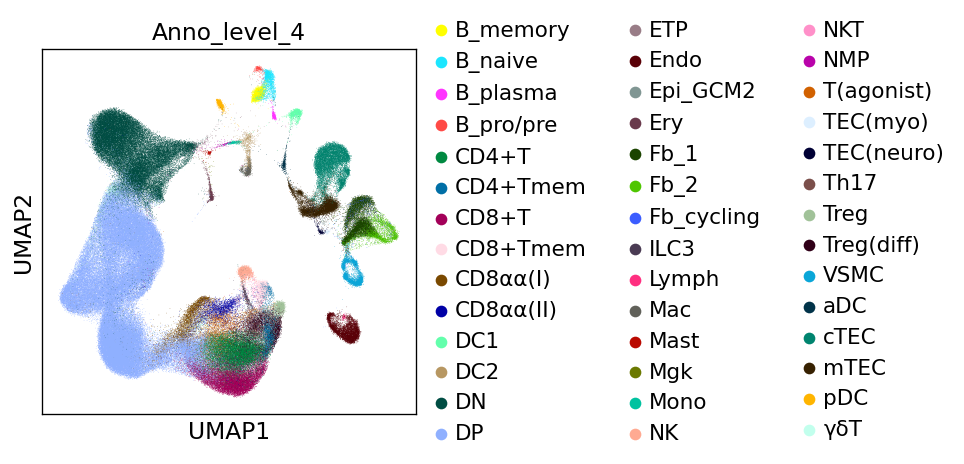

In [5]:
sc.settings.set_figure_params(dpi=60, facecolor='white')
sc.pl.umap(adata, color=['Anno_level_4'])

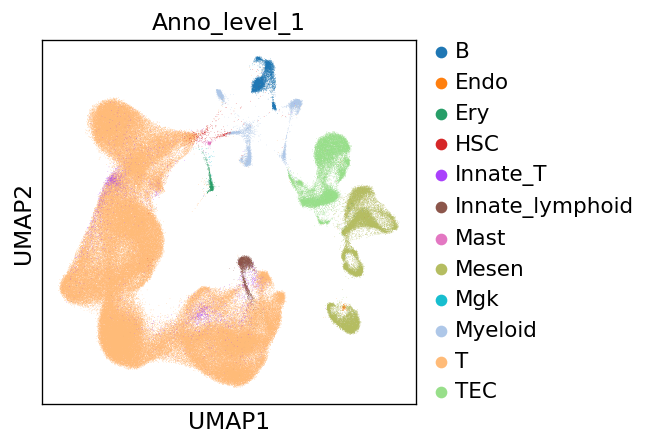

In [9]:
sc.pl.umap(adata, color=['Anno_level_1'])

In [7]:
adata.X.expm1().sum(axis = 1)

matrix([[100000.01 ],
        [ 99999.99 ],
        [ 99999.984],
        ...,
        [100000.   ],
        [100000.   ],
        [ 99999.99 ]], dtype=float32)

In [8]:
adata.obs['Anno_level_1'].value_counts()

T                  201019
Mesen               21290
TEC                 17158
B                    5082
Myeloid              4801
Innate_T             2931
Innate_lymphoid      2176
Ery                   644
HSC                   501
Mast                  148
Endo                  115
Mgk                    36
Name: Anno_level_1, dtype: int64

In [10]:
adata_T = adata[adata.obs['Anno_level_1'].isin(['Innate_T', 'Innate_lymphoid', 'T'])]

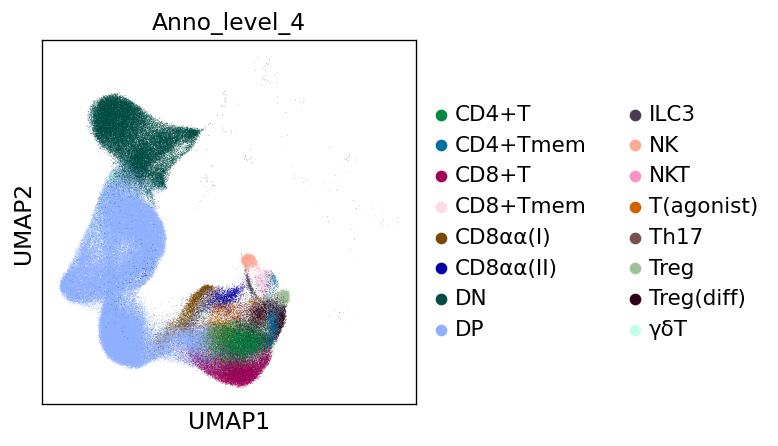

In [11]:
sc.pl.umap(adata_T, color=['Anno_level_4'])

In [12]:
#sc.settings.set_figure_params(dpi=80, facecolor='white')
#sc.pl.umap(adata_T, color=['BATF3','CLU','SOX4','AIF1','ALK','CEBPD','EPCAM','KRT18'],
#color_map = 'RdPu')

In [13]:
save_file = '/lustre/scratch126/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_Tcell_subset.h5ad'
adata_T.write(save_file)

#### CellTypist

In [3]:
input_file = '/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_Tcell_subset.h5ad'
adata_T = sc.read_h5ad(input_file)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [4]:
adata_T.obs['organ'].value_counts()

TH    201019
Name: organ, dtype: int64

In [5]:
adata_T.obs['Anno_level_4'].value_counts()

DP            108418
DN             42474
CD4+T          14506
CD8+T          13257
Treg(diff)      5665
CD8αα(I)        3899
T(agonist)      3614
CD8αα(II)       2884
CD4+Tmem        2152
Treg            1779
CD8+Tmem        1644
Th17             727
Name: Anno_level_4, dtype: int64

In [6]:
#ll = adata_T.obs.sample(frac=1).groupby('Anno_level_5').head(500)
#keep = ll.index
#adata_sub = adata_T[adata_T.obs.index.isin(keep)]
#adata_sub.obs['Anno_level_5'].value_counts()
#downsample to have a test
adata_sub = sc.pp.subsample(adata_T, fraction=0.4, copy=True)
adata_sub.X.shape
adata_sub.obs['Anno_level_4'].value_counts()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


DP            43353
DN            16885
CD4+T          5836
CD8+T          5378
Treg(diff)     2318
CD8αα(I)       1559
T(agonist)     1427
CD8αα(II)      1172
CD4+Tmem        869
CD8+Tmem        670
Treg            661
Th17            279
Name: Anno_level_4, dtype: int64

In [7]:
adata_sub.obs['Anno_level_4'].value_counts()

DP            43353
DN            16885
CD4+T          5836
CD8+T          5378
Treg(diff)     2318
CD8αα(I)       1559
T(agonist)     1427
CD8αα(II)      1172
CD4+Tmem        869
CD8+Tmem        670
Treg            661
Th17            279
Name: Anno_level_4, dtype: int64

In [8]:
adata_sub.X.expm1().sum(axis = 1)

matrix([[ 99999.984],
        [100000.01 ],
        [100000.   ],
        ...,
        [ 99999.99 ],
        [ 99999.99 ],
        [100000.   ]], dtype=float32)

In [9]:
adata_sub.X = adata_sub.X.expm1()/100000
sc.pp.normalize_total(adata_sub, target_sum=1e4)
sc.pp.log1p(adata_sub)

normalizing counts per cell
    finished (0:00:01)


In [10]:
adata_sub.X.expm1().sum(axis = 1)

matrix([[10000.],
        [10000.],
        [10000.],
        ...,
        [10000.],
        [10000.],
        [10000.]])

In [11]:
new_model = celltypist.train(adata_sub, labels = 'Anno_level_4', feature_selection = True)

🍳 Preparing data before training
✂️ 6252 non-expressed genes are filtered out
⚖️ Scaling input data
🏋️ Training data using SGD logistic regression
🔎 Selecting features
🧬 1651 features are selected
🏋️ Starting the second round of training
🏋️ Training data using logistic regression
✅ Model training done!


In [12]:
#new_model.write('/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_T_subset_sub500_feature_selection.pkl')
new_model.write('/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_T_subset_sub0.4_Anno_level4_feature_selection.pkl')

In [3]:
new_model = models.Model.load('/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/download_object/Thymus_T_subset_sub0.2_feature_selection.pkl')

In [13]:
input_file = '/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_soupX_processed_noBatchC.h5ad'
adata = sc.read_h5ad(input_file)

In [37]:
#sc.tl.leiden(adata, resolution=0.1, key_added='leiden_0.8_c22', restrict_to = ('leiden_0.8', ['22']))

running Leiden clustering
    finished: found 37 clusters and added
    'leiden_0.8_c22', the cluster labels (adata.obs, categorical) (0:00:00)


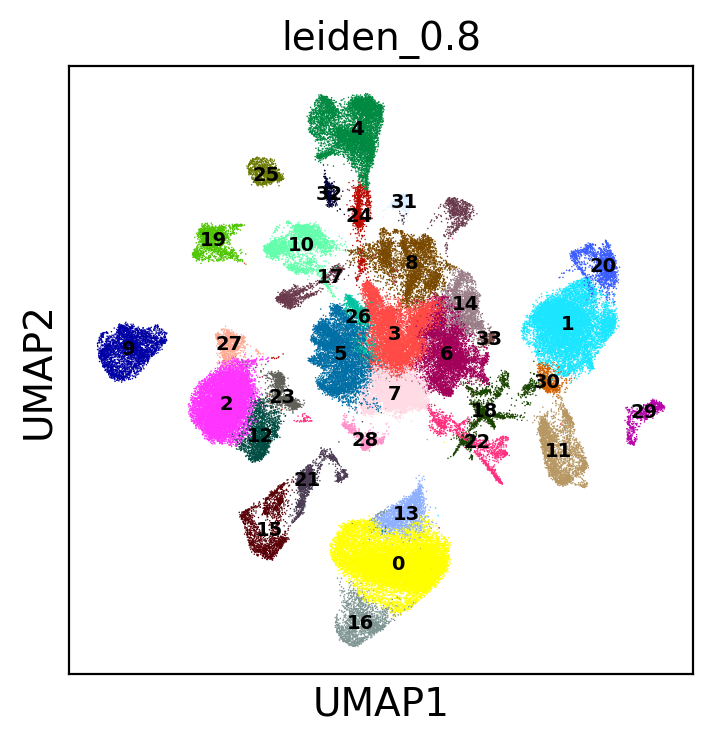

In [5]:
#sc.settings.set_figure_params(dpi=100, facecolor='white')
#sc.pl.umap(adata, color=['leiden_0.8'],legend_loc = 'on data', legend_fontsize=7)

In [14]:
#adata = adata.raw.to_adata()
adata.X.expm1().sum(axis = 1)

matrix([[ 9999.999],
        [ 9999.999],
        [10000.   ],
        ...,
        [10000.   ],
        [10000.   ],
        [10000.   ]], dtype=float32)

In [15]:
predictions = celltypist.annotate(adata, model = new_model, majority_voting = True)

🔬 Input data has 100333 cells and 29085 genes
🔗 Matching reference genes in the model
🧬 1551 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25


running Leiden clustering
    finished: found 362 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:00:55)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [16]:
adata = predictions.to_adata()


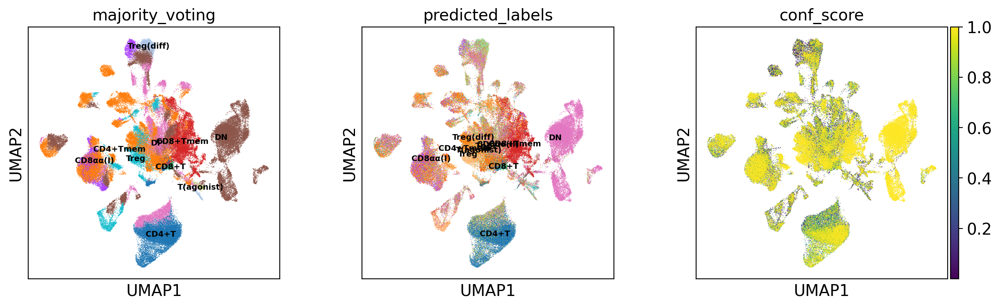

In [17]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color = ['majority_voting','predicted_labels','conf_score'], legend_loc = 'on data', legend_fontsize=7) ### model 0.4 Anno level 4

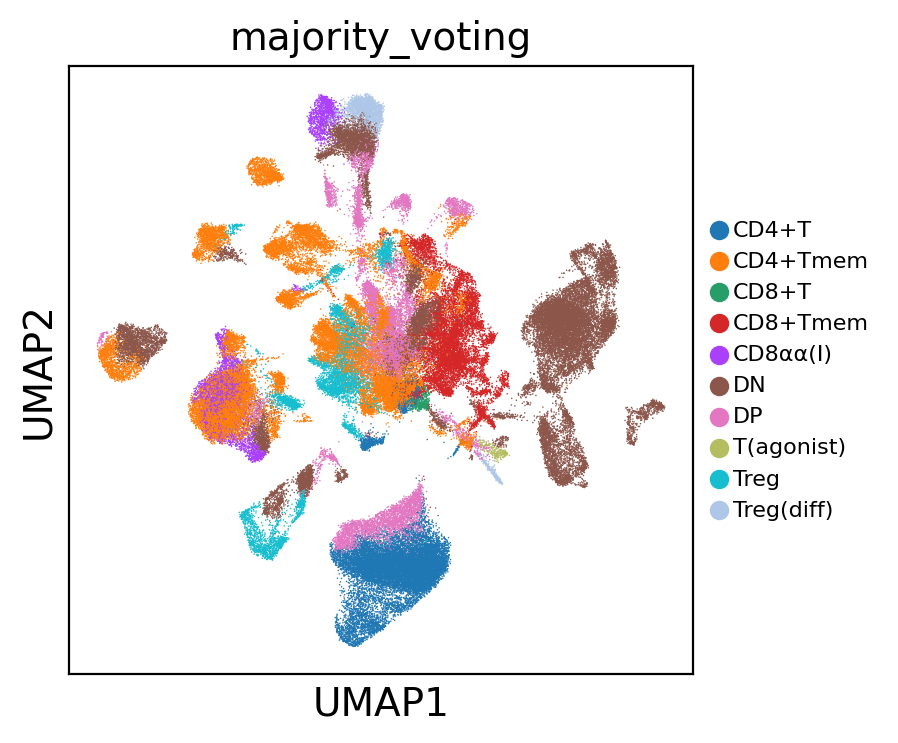

In [18]:
sc.pl.umap(adata, color = ['majority_voting'], legend_fontsize=8)

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor='white')
#sc.pl.umap(adata, color = ['majority_voting','predicted_labels','conf_score'], legend_loc = 'on data', legend_fontsize=7) ### model 0.2

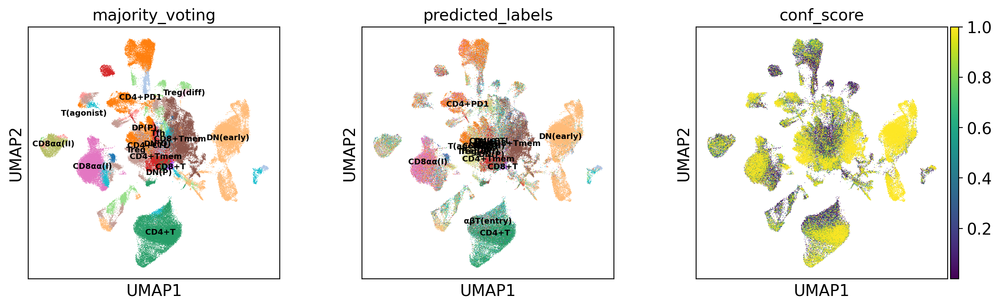

In [15]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color = ['majority_voting','predicted_labels','conf_score'], legend_loc = 'on data', legend_fontsize=7) ### model 0.4

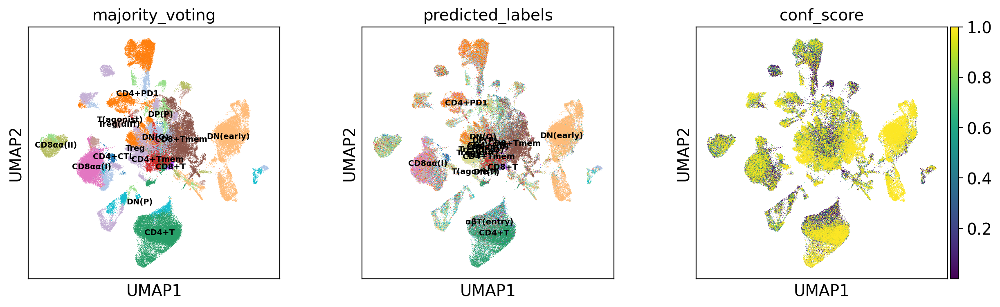

In [24]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color = ['majority_voting','predicted_labels','conf_score'], legend_loc = 'on data', legend_fontsize=7) ### model 0.3

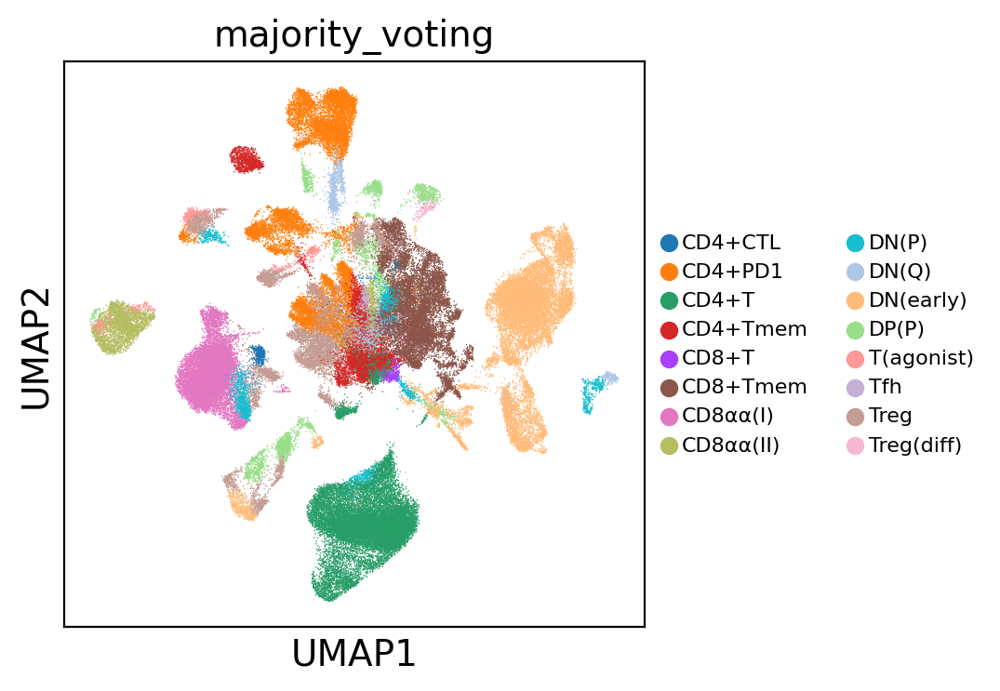

In [16]:
sc.pl.umap(adata, color = ['majority_voting'], legend_fontsize=8)

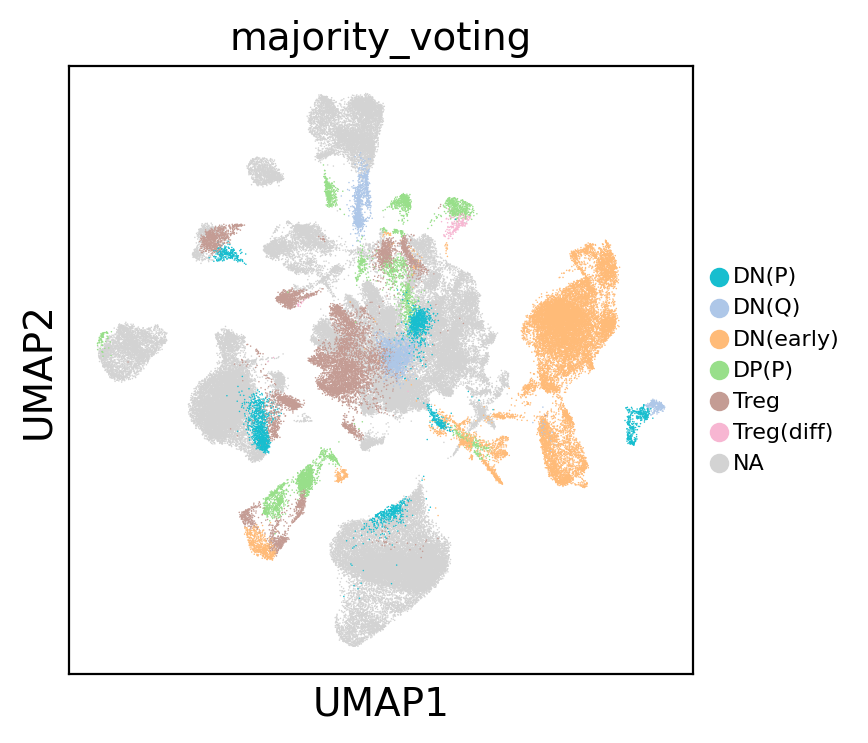

In [17]:
sc.pl.umap(adata, color = ['majority_voting'], legend_fontsize=8, groups=['DN(early)','DN(Q)','DN(P)','DP(P)','Treg','Treg(diff)'])

In [30]:
save_file = '/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/object/Subset_Tcell_soupX_processed_noBatchC.h5ad'
adata.write(save_file)

In [2]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adata, color=['leiden_0.8_c22'], legend_loc='on data', legend_fontsize=7)

NameError: name 'adata' is not defined

In [43]:
adata_TLBL = adata[adata.obs['leiden_0.8_c22'].isin(['1','30','20','11',
                                                     '29','0','13','16','22,0','22,2'])]
adata_TLBL = adata_TLBL[adata_TLBL.obs['tumour_type'].isin(['TLBL'])]

In [44]:
save_file = '/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/object/Subset_TLBL.h5ad'
adata_TLBL.write(save_file)

In [13]:
adata_TLBL = adata[adata.obs['leiden_0.8'].isin(['29'])]
adata_TLBL = adata_TLBL[adata_TLBL.obs['tumour_type'].isin(['TLBL'])]
adata_TLBL = adata_TLBL[adata_TLBL.obs['donor_id'].isin(['TL5737'])]

In [14]:
adata_TLBL.obs['donor_id'].value_counts()

TL5737    595
Name: donor_id, dtype: int64

In [15]:
save_file = '/lustre/scratch117/cellgen/team205/rl20/T_cell_lym/object/Subset_TLBL_TL5737.h5ad'
adata_TLBL.write(save_file)